<a href="https://colab.research.google.com/github/AnnaGAV12/Forecasting_and_diagnostics_in_medicine/blob/main/HW_task_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://www.kaggle.com/datasets/debeshjha1/kvasircapsuleseg

Итоговое задание - выполнить сегментацию полипов согласно приложенного датасета.

подготовить данные должным образом.

Попробовать различные архитектуры, выбрать наилучшую.

Попробовать аугментацию, трансферное обучение.

Визуализировать предсказания выбранной модели.

Составить обобщающий хороший вывод.

(по желанию) сделать API


# **Набор данных видеокапсульной эндоскопии для сегментации полипов**, которое содержит изображения полипов, их истинные данные сегментации и информацию об ограничивающих рамках.
Класс полипов Kvasir-Capsule содержит всего 55 изображений

**Загрузка данных и библиотек**

In [1]:
from google.colab import files
files.upload()

Saving archive.zip to archive.zip


{'archive.zip': b'PK\x03\x04-\x00\x00\x00\x08\x00s\xb5\xb3R\t]\xa5\xcf\xff\xff\xff\xff\xff\xff\xff\xff\x1d\x00\x14\x00Kvasir-Capsule/2104.11138.pdf\x01\x00\x10\x00\xae\x7f\x15\x00\x00\x00\x00\x00\xd0o\x14\x00\x00\x00\x00\x00\xd4\xb8uX\x9c\xdd\xd3&\x88kB\x02\x84\x90\xe0\x10\x08\xd6\xb8;\x04\xa7\xd1\xc6]B\xe3\xee.\x01\x02\x81\xe0\xee\xda\xb8\xa5q\'\x04\xd7@pw\x97\xe0\x0e\xdb\xbc\xf6{\xbf\x9d\x99\xddo\xf6\xda\x7f\xa6\xe1z\xba\x8fV\x9dSUw\xdd\xf5P)\x8aI0\xb00r`PEb\xb0\xb0\xb1\x931\x93\xd9\x1aY`\xf0\xf3\x931I\x98[9\x81\x1d`\xdfV\x86N`1\xf0G[c0\x19\x93,\xd8\xc6\xd4\xc9\x8c\x8c\x9d\x8b\x9d\x85LP\x10\xc3\xd1\xc9\x01lh\x8d\xe16\x1b\xae-\xed\xba\xc6\x89\xd3\xba\xa5~E\xd3fj_\xcf\xe4\xe8\xd8\xc8\'\xad\xd0(p\x8ac\xea`\xe7\x95%\xa5\xb1\x8a)n!EG<R\x91yS\x8c\xa1c\\L\x8d\x0f_H\x07@\xb2@=\xab\xeb\xc9|\xd8X\xd8\xbf\xb5\x9dO\xbd\x0f\xf7<\xbd\xe7Z\x12\xf49\xad;\xe2\x9fj\xfa\x92\x0e@\x1fK\xedIL\xa5\xe9O\xa3\x19\xb4\x89\x99v\x8e\xa1lr\x07\xd8fp>\x1c\x9c\xae\tu\xeb\x8dQ9B\xa7#G\xc1\x84\xee\xe5\xb8\x90\xd1!N4\

In [2]:
!ls

archive.zip  sample_data


In [3]:
!unzip "/content/archive.zip" -d /content

Archive:  /content/archive.zip
  inflating: /content/Kvasir-Capsule/2104.11138.pdf  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28955.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28956.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28957.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28958.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28959.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28960.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28961.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28962.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28963.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28964.jpg  
  inflating: /content/Kvasir-Capsule/annotated_images/131368cc17e44240_28965.jpg  
  

In [4]:
!pip install --quiet segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 92.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 72.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.8 MB/s eta 0:00:00


In [5]:
from collections import defaultdict
import copy
import random
import os
import segmentation_models_pytorch.utils as smp_utils
from segmentation_models_pytorch import Linknet

import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim
from torch.utils.data import Dataset, DataLoader


**SegNet**

In [6]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
            )
        self.pool0 =  nn.MaxPool2d(kernel_size=2, return_indices=True)
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
            )
        self.pool1 =  nn.MaxPool2d(kernel_size=2, return_indices=True)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
            )
        self.pool2 =  nn.MaxPool2d(kernel_size=2, return_indices=True)
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
            )
        self.pool3 =  nn.MaxPool2d(kernel_size=2, return_indices=True)
        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
            )
        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2)
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
            )
        self.upsample1 = nn.MaxUnpool2d(kernel_size=2)
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
            )
        self.upsample2 = nn.MaxUnpool2d(kernel_size=2)
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
            )
        self.upsample3 = nn.MaxUnpool2d(kernel_size=2)
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=3, padding=1),
            nn.Sigmoid()
            )
    def forward(self, x):
        # encoder
        e0, indices_e0 = self.pool0(self.enc_conv0(x))
        e1, indices_e1 = self.pool1(self.enc_conv1(e0))
        e2, indices_e2 = self.pool2(self.enc_conv2(e1))
        e3, indices_e3 = self.pool3(self.enc_conv3(e2))
        # bottleneck
        b = self.bottleneck_conv(e3)
        # decoder
        d0 = self.dec_conv0(self.upsample0(b, indices_e3))
        d1 = self.dec_conv1(self.upsample1(d0, indices_e2))
        d2 = self.dec_conv2(self.upsample2(d1, indices_e1))
        d3 = self.dec_conv3(self.upsample3(d2, indices_e0))
        return d3

**UNet**

In [7]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
            )
        self.pool0 =  nn.MaxPool2d(kernel_size=2, return_indices=True) # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
            )
        self.pool1 =  nn.MaxPool2d(kernel_size=2, return_indices=True) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, return_indices=True) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, return_indices=True) # 32 -> 16
        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
        )
        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2)# 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
            )
        self.upsample1 = nn.MaxUnpool2d(kernel_size=2)# 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
            )
        self.upsample2 = nn.MaxUnpool2d(kernel_size=2)# 64 -> 128
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
            )
        self.upsample3 = nn.MaxUnpool2d(kernel_size=2)# 128 -> 256
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=1),
            nn.Sigmoid()
            )
    def forward(self, x):
        # encoder
        enc0 = self.enc_conv0(x)
        pool0, indices_e0 = self.pool0(enc0)
        enc1 = self.enc_conv1(pool0)
        pool1, indices_e1 = self.pool1(enc1)
        enc2 = self.enc_conv2(pool1)
        pool2, indices_e2 = self.pool2(enc2)
        enc3 = self.enc_conv3(pool2)
        pool3, indices_e3 = self.pool3(enc3)
        # bottleneck
        b = self.bottleneck_conv(pool3)
        # decoder
        d0 = self.dec_conv0(torch.cat((self.upsample0(b, indices_e3), enc3), dim=1))
        d1 = self.dec_conv1(torch.cat((self.upsample1(d0, indices_e2), enc2), dim=1))
        d2 = self.dec_conv2(torch.cat((self.upsample2(d1, indices_e1), enc1), dim=1))
        d3 = self.dec_conv3(torch.cat((self.upsample3(d2, indices_e0), enc0), dim=1))
        # no activation
        return d3


**Разделение на тренировочную, валидационную и тестовую выборки**

In [8]:
root_directory = os.path.join('/content/Kvasir-Capsule')
images_directory = os.path.join(root_directory, 'images')
masks_directory = os.path.join(root_directory, 'masks')

images_filenames = list(sorted(os.listdir(images_directory)))
correct_images_filenames = [i for i in images_filenames if cv2.imread(os.path.join(images_directory, i)) is not None]

random.seed(42)
random.shuffle(correct_images_filenames)

train_images_filenames = correct_images_filenames[:40]
val_images_filenames = correct_images_filenames[40:-5]
test_images_filenames = images_filenames[-5:]

print(len(train_images_filenames), len(val_images_filenames), len(test_images_filenames))

40 10 5


**Визуализация датасета и предсказаний**

In [9]:
def display_image_grid(images_filenames, images_directory, masks_directory, predicted_masks=None):
    cols = 3 if predicted_masks else 2
    rows = len(images_filenames)
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(10, 10))
    for i, image_filename in enumerate(images_filenames):
        image = cv2.imread(os.path.join(images_directory, image_filename))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(os.path.join(masks_directory, image_filename), cv2.IMREAD_UNCHANGED,)
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest")

        ax[i, 0].set_title("Image")
        ax[i, 1].set_title("Truth mask")

        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()

        if predicted_masks:
            predicted_mask = predicted_masks[i]
            ax[i, 2].imshow(predicted_mask.squeeze(), interpolation="nearest", cmap='gray')
            ax[i, 2].set_title("Predicted mask")
            ax[i, 2].set_axis_off()
    plt.tight_layout()
    plt.show()

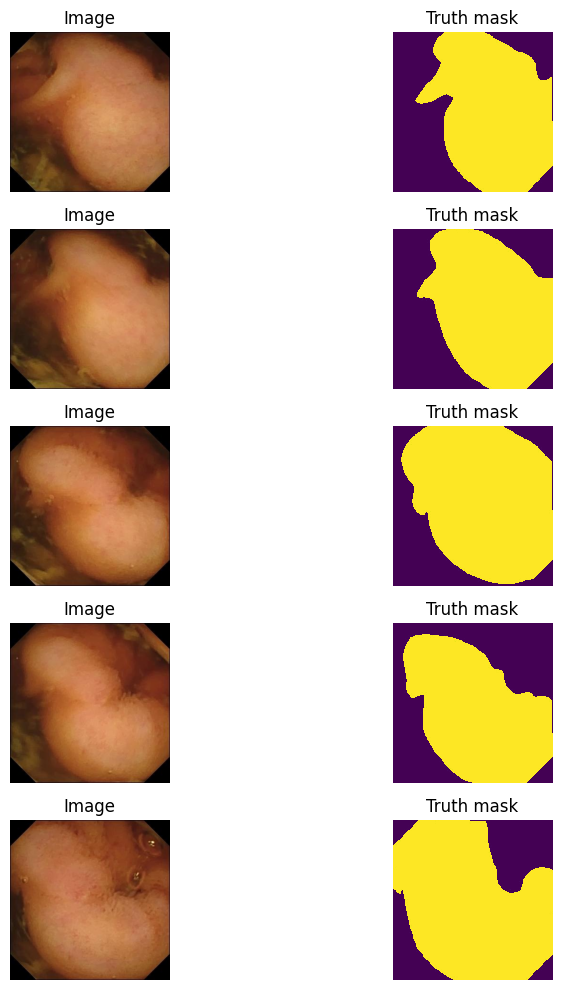

In [10]:
display_image_grid(test_images_filenames, images_directory, masks_directory)

**Загрузка, подготовка и аугментация данных**

In [11]:
class KvasirCapsuleSEG(Dataset):
    def __init__(self, images_filenames, images_directory, masks_directory, transform=None):
        self.images_filenames = images_filenames
        self.images_directory = images_directory
        self.masks_directory = masks_directory
        self.transform = transform

    def __len__(self):
        return len(self.images_filenames)

    def __getitem__(self, idx):
        image_filename = self.images_filenames[idx]
        image = cv2.imread(os.path.join(self.images_directory, image_filename))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(
            os.path.join(self.masks_directory, image_filename), cv2.IMREAD_UNCHANGED,
        )
        # mask = preprocess_mask(mask)
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"] / 255
            mask = transformed["mask"] / 255

        return image, mask

In [14]:
train_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.Affine(
            translate_percent=0.2,  # аналог shift_limit
            scale=(0.8, 1.2),      # аналог scale_limit (0.8 = 1 - 0.2, 1.2 = 1 + 0.2)
            rotate=(-30, 30),       # аналог rotate_limit
            p=0.5
        ),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.5),
        ToTensorV2(),
    ]
)
val_dataset = KvasirCapsuleSEG(val_images_filenames, images_directory, masks_directory, transform=val_transform,)

In [15]:
train_dataset[0]

(tensor([[[0.0706, 0.0706, 0.0706,  ..., 0.3686, 0.2431, 0.1647],
          [0.0706, 0.0706, 0.0706,  ..., 0.5725, 0.4706, 0.3490],
          [0.0706, 0.0706, 0.0706,  ..., 0.6000, 0.5843, 0.5686],
          ...,
          [0.0706, 0.0706, 0.0706,  ..., 0.0706, 0.0706, 0.0706],
          [0.0706, 0.0706, 0.0706,  ..., 0.0706, 0.0706, 0.0706],
          [0.0706, 0.0706, 0.0706,  ..., 0.0706, 0.0706, 0.0706]],
 
         [[0.0667, 0.0667, 0.0667,  ..., 0.1961, 0.0902, 0.0667],
          [0.0667, 0.0667, 0.0667,  ..., 0.3843, 0.2941, 0.1765],
          [0.0667, 0.0667, 0.0667,  ..., 0.3882, 0.3882, 0.3882],
          ...,
          [0.0667, 0.0667, 0.0667,  ..., 0.0667, 0.0667, 0.0667],
          [0.0667, 0.0667, 0.0667,  ..., 0.0667, 0.0667, 0.0667],
          [0.0667, 0.0667, 0.0667,  ..., 0.0667, 0.0667, 0.0667]],
 
         [[0.1255, 0.1255, 0.1255,  ..., 0.2510, 0.1686, 0.1490],
          [0.1255, 0.1255, 0.1255,  ..., 0.3922, 0.3255, 0.2353],
          [0.1255, 0.1255, 0.1255,  ...,

**Визуализация аугментации**

In [16]:
def visualize_augmentations(dataset, idx=0, samples=5):
    dataset = copy.deepcopy(dataset)
    dataset.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (ToTensorV2))])
    figure, ax = plt.subplots(nrows=samples, ncols=2, figsize=(13, 13))
    for i in range(samples):
        image, mask = next(iter(dataset)) # dataset[idx]
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest")
        ax[i, 0].set_title("Augmented image")
        ax[i, 1].set_title("Augmented mask")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
    plt.tight_layout()
    plt.show()


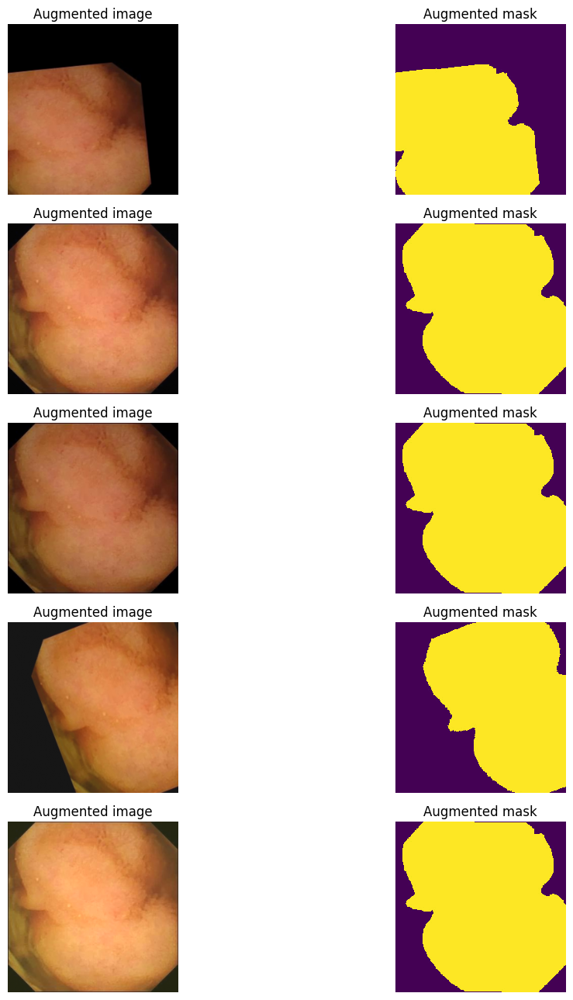

In [17]:
random.seed(42)
visualize_augmentations(train_dataset, idx=0)


# Вспомогательные функции
**Мониторинг метрики и фукции потерь**

In [18]:
class MetricMonitor:
    def __init__(self, float_precision=3):
        self.float_precision = float_precision
        self.reset()

    def reset(self):
        self.metrics = defaultdict(lambda: {"val": 0, "count": 0, "avg": 0})

    def update(self, metric_name, val):
        metric = self.metrics[metric_name]

        metric["val"] += val
        metric["count"] += 1
        metric["avg"] = metric["val"] / metric["count"]

    def __str__(self):
        return " | ".join(
            [
                "{metric_name}: {avg:.{float_precision}f}".format(
                    metric_name=metric_name, avg=metric["avg"], float_precision=self.float_precision
                )
                for (metric_name, metric) in self.metrics.items()
            ]
        )

**Для обучения**

In [19]:
def train(train_loader, model, criterion, metric, optimizer, epoch, params):
    metric_monitor = MetricMonitor()
    model.train()
    stream = tqdm(train_loader)
    for i, (images, target) in enumerate(stream, start=1):
        images = images
        target = target.float()
        output = model(images).squeeze(1).float()
        loss = criterion(output, target)
        iou = metric(output, target)
        metric_monitor.update("Loss", loss.item())
        metric_monitor.update("IOU", iou.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        stream.set_description(
            "Epoch: {epoch}. Train. {metric_monitor}".format(epoch=epoch, metric_monitor=metric_monitor)
        )



**Для валидации**

In [20]:
def validate(val_loader, model, criterion, metric, epoch, params):
    metric_monitor = MetricMonitor()
    model.eval()
    stream = tqdm(val_loader)
    with torch.no_grad():
        for i, (images, target) in enumerate(stream, start=1):
            images = images
            target = target.float()
            output = model(images).squeeze(1).float()
            iou = metric(output, target)
            loss = criterion(output, target)
            metric_monitor.update("Loss", loss.item())
            metric_monitor.update("IOU", iou.item())
            stream.set_description(
                "Epoch: {epoch}. Validation. {metric_monitor}".format(epoch=epoch, metric_monitor=metric_monitor)
            )


**Для компиляции**

In [21]:
def train_and_validate(model, train_dataset, val_dataset, params):
    train_loader = DataLoader(
        train_dataset,
        batch_size=params["batch_size"],
        shuffle=True,
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=params["batch_size"],
        shuffle=False,
    )
    metric = smp_utils.metrics.IoU()
    criterion = smp_utils.losses.DiceLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=params["lr"])
    for epoch in range(1, params["epochs"] + 1):
        train(train_loader, model, criterion, metric, optimizer, epoch, params)
        validate(val_loader, model, criterion, metric, epoch, params)
    return model

**Для предсказания**

In [22]:
def predict(model, params, test_dataset, batch_size):
    test_loader = DataLoader(
        test_dataset, batch_size=batch_size, shuffle=False,
    )
    model.eval()
    predictions = []
    with torch.no_grad():
        for images, (original_heights, original_widths) in test_loader:
            images = images
            output = model(images)
            probabilities = torch.sigmoid(output.squeeze(1))
            predicted_masks = probabilities.float() #(probabilities >= 0.5).float() * 1
            predicted_masks = predicted_masks.numpy()
            for predicted_mask, original_height, original_width in zip(
                predicted_masks, original_heights.numpy(), original_widths.numpy()
            ):
                predictions.append((predicted_mask, original_height, original_width))
    return predictions

**Обучение**

In [23]:
params = {
    "lr": 0.001,
    "batch_size": 4,
    "epochs": 10,
}

**UNet**

In [24]:
u_model = UNet()
u_model = train_and_validate(u_model, train_dataset, val_dataset, params)

Epoch: 1. Train. Loss: 0.287 | IOU: 0.703: 100%|██████████| 10/10 [03:30<00:00, 21.01s/it]
Epoch: 1. Validation. Loss: 0.270 | IOU: 0.707: 100%|██████████| 3/3 [00:14<00:00,  4.72s/it]
Epoch: 2. Train. Loss: 0.192 | IOU: 0.818: 100%|██████████| 10/10 [03:13<00:00, 19.36s/it]
Epoch: 2. Validation. Loss: 0.188 | IOU: 0.789: 100%|██████████| 3/3 [00:16<00:00,  5.41s/it]
Epoch: 3. Train. Loss: 0.160 | IOU: 0.834: 100%|██████████| 10/10 [03:12<00:00, 19.20s/it]
Epoch: 3. Validation. Loss: 0.161 | IOU: 0.817: 100%|██████████| 3/3 [00:13<00:00,  4.56s/it]
Epoch: 4. Train. Loss: 0.166 | IOU: 0.798: 100%|██████████| 10/10 [03:14<00:00, 19.43s/it]
Epoch: 4. Validation. Loss: 0.151 | IOU: 0.840: 100%|██████████| 3/3 [00:14<00:00,  4.69s/it]
Epoch: 5. Train. Loss: 0.144 | IOU: 0.810: 100%|██████████| 10/10 [03:13<00:00, 19.35s/it]
Epoch: 5. Validation. Loss: 0.139 | IOU: 0.802: 100%|██████████| 3/3 [00:14<00:00,  4.73s/it]
Epoch: 6. Train. Loss: 0.126 | IOU: 0.833: 100%|██████████| 10/10 [03:19<00

**SegNet**

In [25]:
sn_model = SegNet()
sn_model = train_and_validate(sn_model, train_dataset, val_dataset, params)

Epoch: 1. Train. Loss: 0.350 | IOU: 0.547: 100%|██████████| 10/10 [03:06<00:00, 18.66s/it]
Epoch: 1. Validation. Loss: 0.424 | IOU: 0.614: 100%|██████████| 3/3 [00:12<00:00,  4.09s/it]
Epoch: 2. Train. Loss: 0.210 | IOU: 0.699: 100%|██████████| 10/10 [02:51<00:00, 17.11s/it]
Epoch: 2. Validation. Loss: 0.193 | IOU: 0.688: 100%|██████████| 3/3 [00:12<00:00,  4.06s/it]
Epoch: 3. Train. Loss: 0.174 | IOU: 0.747: 100%|██████████| 10/10 [02:48<00:00, 16.83s/it]
Epoch: 3. Validation. Loss: 0.156 | IOU: 0.751: 100%|██████████| 3/3 [00:12<00:00,  4.08s/it]
Epoch: 4. Train. Loss: 0.133 | IOU: 0.793: 100%|██████████| 10/10 [02:49<00:00, 16.96s/it]
Epoch: 4. Validation. Loss: 0.089 | IOU: 0.848: 100%|██████████| 3/3 [00:12<00:00,  4.25s/it]
Epoch: 5. Train. Loss: 0.120 | IOU: 0.798: 100%|██████████| 10/10 [02:56<00:00, 17.67s/it]
Epoch: 5. Validation. Loss: 0.105 | IOU: 0.821: 100%|██████████| 3/3 [00:12<00:00,  4.25s/it]
Epoch: 6. Train. Loss: 0.119 | IOU: 0.794: 100%|██████████| 10/10 [02:57<00

**Трансферное обучение c ResNet50**

In [26]:
res_model = Linknet(encoder_name='resnet50',
               encoder_weights='imagenet',
               classes=1,
               activation='sigmoid')
res_model = train_and_validate(res_model, train_dataset, val_dataset, params)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Epoch: 1. Train. Loss: 0.326 | IOU: 0.681: 100%|██████████| 10/10 [00:44<00:00,  4.46s/it]
Epoch: 1. Validation. Loss: 0.453 | IOU: 0.556: 100%|██████████| 3/3 [00:04<00:00,  1.34s/it]
Epoch: 2. Train. Loss: 0.172 | IOU: 0.831: 100%|██████████| 10/10 [00:44<00:00,  4.41s/it]
Epoch: 2. Validation. Loss: 0.423 | IOU: 0.519: 100%|██████████| 3/3 [00:03<00:00,  1.06s/it]
Epoch: 3. Train. Loss: 0.131 | IOU: 0.851: 100%|██████████| 10/10 [00:44<00:00,  4.48s/it]
Epoch: 3. Validation. Loss: 0.240 | IOU: 0.695: 100%|██████████| 3/3 [00:03<00:00,  1.01s/it]
Epoch: 4. Train. Loss: 0.121 | IOU: 0.849: 100%|██████████| 10/10 [00:44<00:00,  4.50s/it]
Epoch: 4. Validation. Loss: 0.114 | IOU: 0.870: 100%|██████████| 3/3 [00:03<00:00,  1.02s/it]
Epoch: 5. Train. Loss: 0.097 | IOU: 0.876: 100%|██████████| 10/10 [00:44<00:00,  4.43s/it]
Epoch: 5. Validation. Loss: 0.100 | IOU: 0.869: 100%|██████████| 3/3 [00:03<00:00,  1.13s/it]
Epoch: 6. Train. Loss: 0.105 | IOU: 0.850: 100%|██████████| 10/10 [00:44<00

# **Работа нейросети на тесте**
**Загрузка и преобразование тестового датасета**

In [27]:
class KvasirCapsuleSEGInference(Dataset):
    def __init__(self, images_filenames, images_directory
                 #, masks_directory
                 , transform=None):
        self.images_filenames = images_filenames
        self.images_directory = images_directory
        #self.masks_directory = masks_directory
        self.transform = transform

    def __len__(self):
        return len(self.images_filenames)

    def __getitem__(self, idx):
        image_filename = self.images_filenames[idx]
        image = cv2.imread(os.path.join(self.images_directory, image_filename))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        original_size = tuple(image.shape[:2])
        #mask = cv2.imread(
            #os.path.join(self.masks_directory, image_filename),
            #cv2.IMREAD_UNCHANGED)
        if self.transform is not None:
            transformed = self.transform(image=image
                                         #, mask=mask
                                         )
            image = transformed["image"] / 255
            #mask = transformed["mask"] / 255

        return image, original_size #, mask

In [28]:
test_transform = A.Compose(
    [A.Resize(256, 256), ToTensorV2()]
)
test_dataset = KvasirCapsuleSEGInference(test_images_filenames, images_directory, transform=test_transform,) # masks_directory,


In [29]:
test_dataset[0]

(tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]),
 (336, 336))

# Предсказание
**Визуализация результатов**

SegNet

In [32]:
predictions = predict(sn_model, params, test_dataset, batch_size=1)

In [35]:
import cv2

In [37]:
from albumentations.augmentations.geometric.resize import Resize

predicted_masks = []
resize_transform = Resize(height=original_height, width=original_width, interpolation=cv2.INTER_NEAREST)

for predicted_256x256_mask, original_height, original_width in predictions:
    full_sized_mask = resize_transform(image=predicted_256x256_mask)['image']
    predicted_masks.append(full_sized_mask)

In [38]:
predictions[0]

(array([[0.52617055, 0.5109769 , 0.5075872 , ..., 0.5030369 , 0.5028697 ,
         0.51535124],
        [0.5095917 , 0.5017856 , 0.5012346 , ..., 0.5002437 , 0.50033075,
         0.50435245],
        [0.50420976, 0.50083935, 0.5004115 , ..., 0.50010234, 0.5000956 ,
         0.50223243],
        ...,
        [0.50160897, 0.5001135 , 0.5000374 , ..., 0.5001184 , 0.50019854,
         0.5034961 ],
        [0.50190514, 0.5002146 , 0.5000581 , ..., 0.50026023, 0.50037706,
         0.5063032 ],
        [0.5110017 , 0.50301534, 0.5016066 , ..., 0.50387543, 0.50700885,
         0.5315218 ]], dtype=float32),
 np.int64(336),
 np.int64(336))

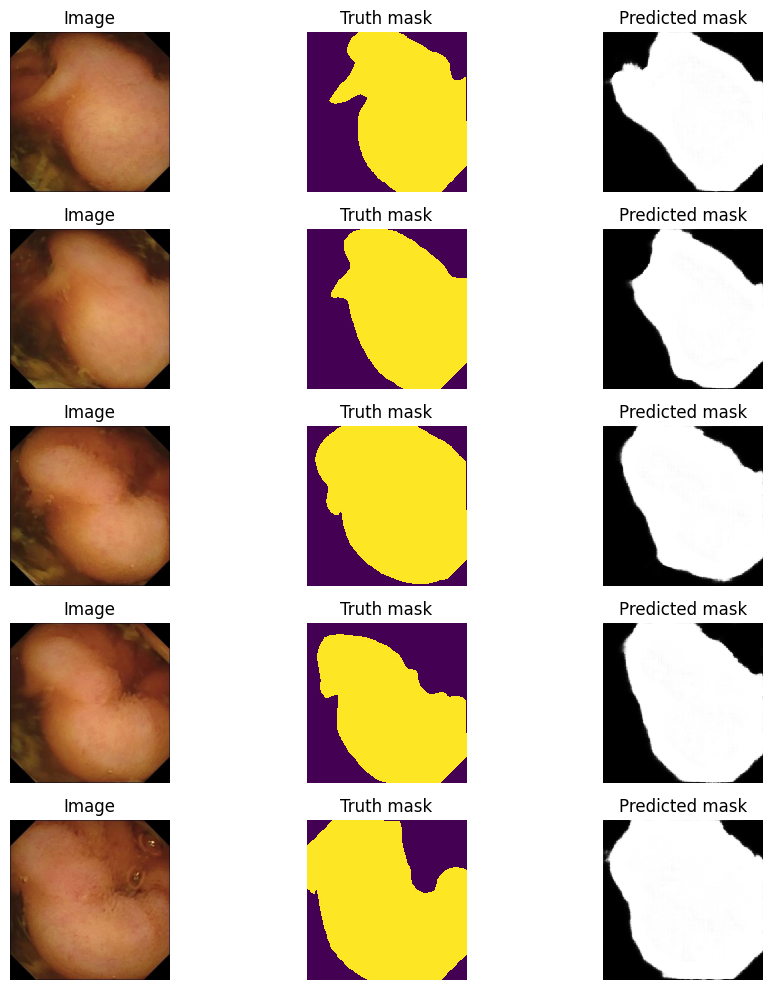

In [39]:
display_image_grid(test_images_filenames, images_directory, masks_directory, predicted_masks=predicted_masks)

**UNet**

In [40]:
predictions = predict(u_model, params, test_dataset, batch_size=1)

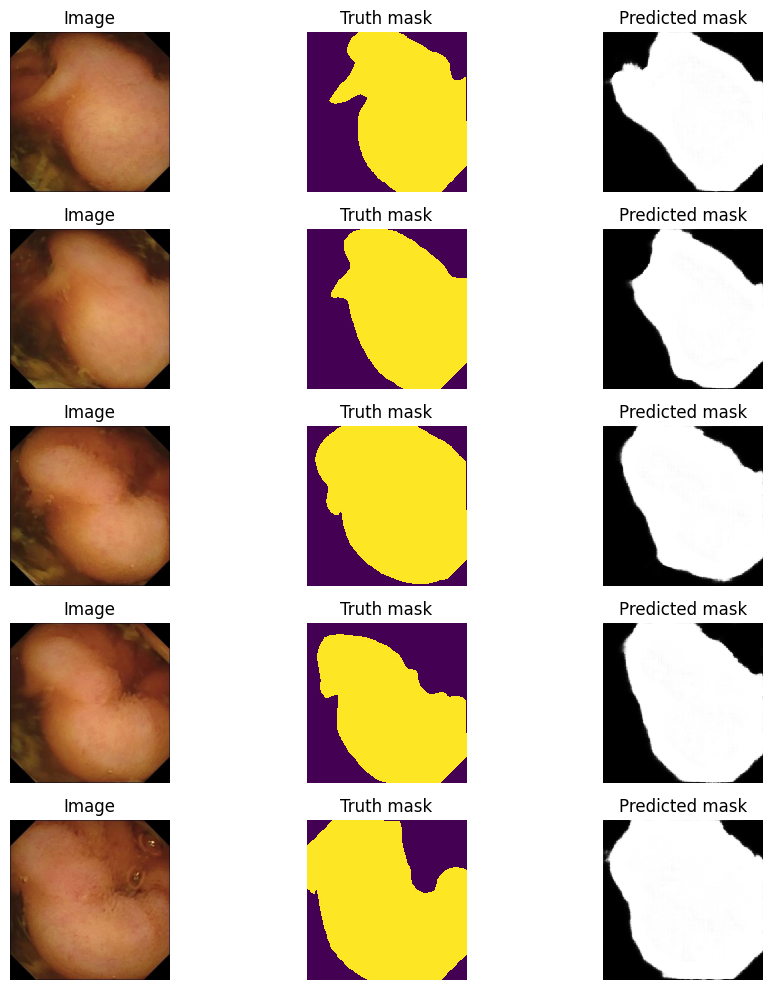

In [41]:
display_image_grid(test_images_filenames, images_directory, masks_directory, predicted_masks=predicted_masks)

**ResNet**

In [42]:
predictions = predict(res_model, params, test_dataset, batch_size=1)

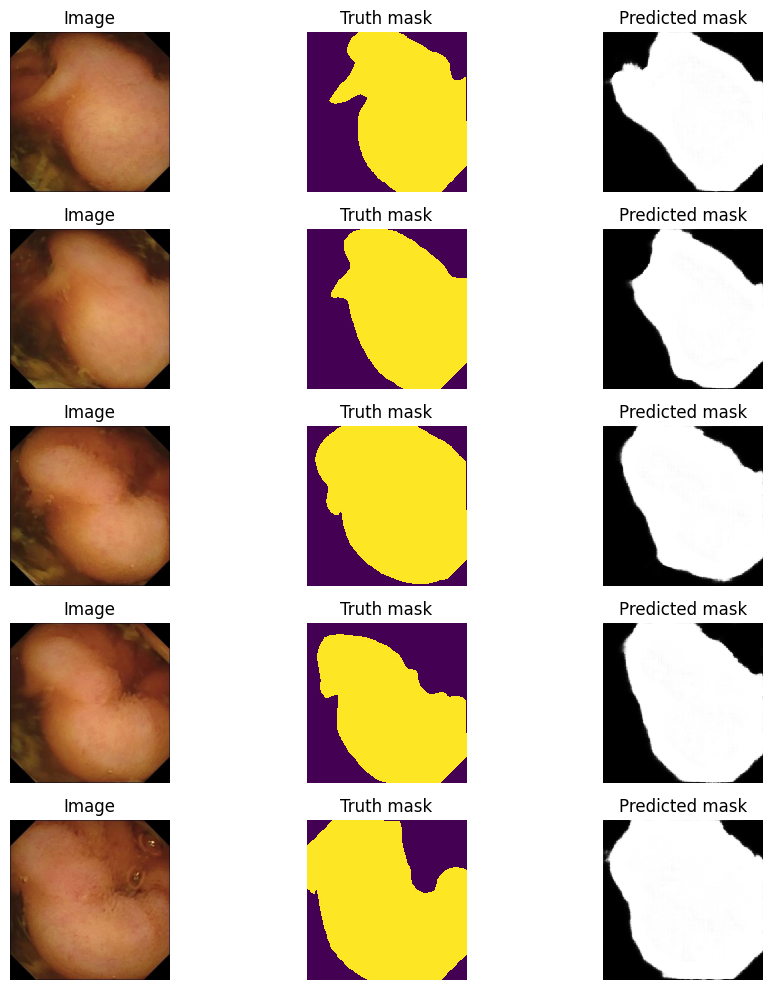

In [43]:
display_image_grid(test_images_filenames, images_directory, masks_directory, predicted_masks=predicted_masks)

# Выводы:
Все три нейросети неплохо предсказывают полипы. Качество сравнимое. Лучшая нейросеть по метрикам - претренированная ResNet50.
Разметка масок сделана не очень хорошо.
Осложняет маленький размер датасета, но аугментация частично спасает.
Большее количество эпох может улучшить качество нейросетей. Но в самописные нейросети при этом необходимо добавить слои Dropout, чтобы избежать переобучения